In [ ]:
!unzip /content/drive/MyDrive/img_align_celeba.zip

Streaming output truncated to the last 5000 lines.
 extracting: img_align_celeba/197600.jpg  
 extracting: img_align_celeba/197601.jpg  
 extracting: img_align_celeba/197602.jpg  
 extracting: img_align_celeba/197603.jpg  
 extracting: img_align_celeba/197604.jpg  
 extracting: img_align_celeba/197605.jpg  
 extracting: img_align_celeba/197606.jpg  
 extracting: img_align_celeba/197607.jpg  
 extracting: img_align_celeba/197608.jpg  
 extracting: img_align_celeba/197609.jpg  
 extracting: img_align_celeba/197610.jpg  
 extracting: img_align_celeba/197611.jpg  
 extracting: img_align_celeba/197612.jpg  
 extracting: img_align_celeba/197613.jpg  
 extracting: img_align_celeba/197614.jpg  
 extracting: img_align_celeba/197615.jpg  
 extracting: img_align_celeba/197616.jpg  
 extracting: img_align_celeba/197617.jpg  
 extracting: img_align_celeba/197618.jpg  
 extracting: img_align_celeba/197619.jpg  
 extracting: img_align_celeba/197620.jpg  
 extracting: img_align_celeba/197621.jpg  
 ex

Epoch [1/30] | Loss D: 1.1453, Loss G: 2.8534
Epoch [2/30] | Loss D: 1.2926, Loss G: 3.6689
Epoch [3/30] | Loss D: 0.8780, Loss G: 2.4193
Epoch [4/30] | Loss D: 0.8513, Loss G: 3.3624
Epoch [5/30] | Loss D: 0.4977, Loss G: 4.1182


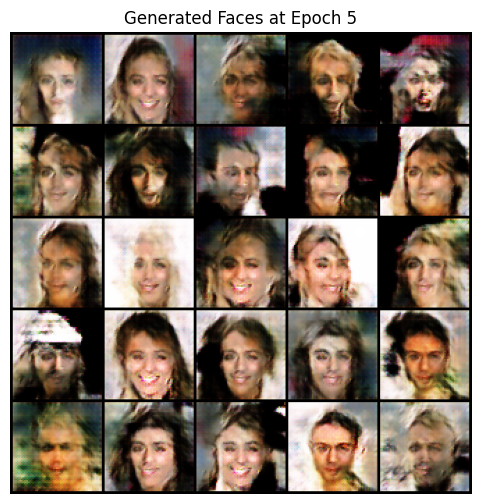

Epoch [6/30] | Loss D: 0.8989, Loss G: 4.0055
Epoch [7/30] | Loss D: 0.8300, Loss G: 2.2659
Epoch [8/30] | Loss D: 0.7278, Loss G: 3.2534
Epoch [9/30] | Loss D: 1.3485, Loss G: 2.0067
Epoch [10/30] | Loss D: 1.0717, Loss G: 3.2867


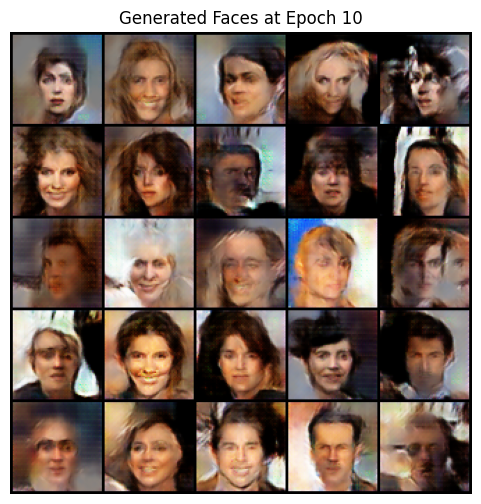

Epoch [11/30] | Loss D: 1.5097, Loss G: 1.0378
Epoch [12/30] | Loss D: 1.0721, Loss G: 5.2196
Epoch [13/30] | Loss D: 1.1535, Loss G: 4.1639
Epoch [14/30] | Loss D: 0.7753, Loss G: 3.1080
Epoch [15/30] | Loss D: 1.4723, Loss G: 6.9921


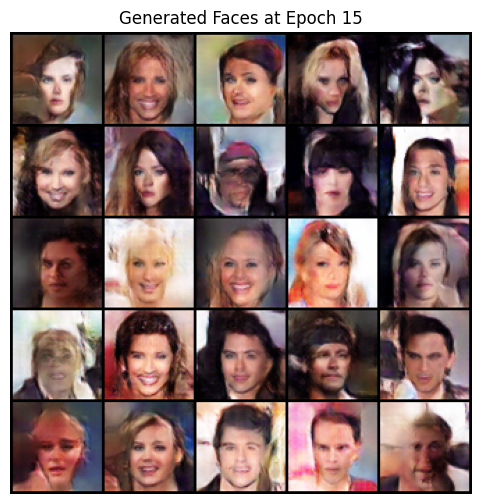

Epoch [16/30] | Loss D: 0.3061, Loss G: 3.9053
Epoch [17/30] | Loss D: 1.3718, Loss G: 6.6775
Epoch [18/30] | Loss D: 1.7336, Loss G: 9.0207
Epoch [19/30] | Loss D: 0.6102, Loss G: 5.2126
Epoch [20/30] | Loss D: 0.8926, Loss G: 3.1734


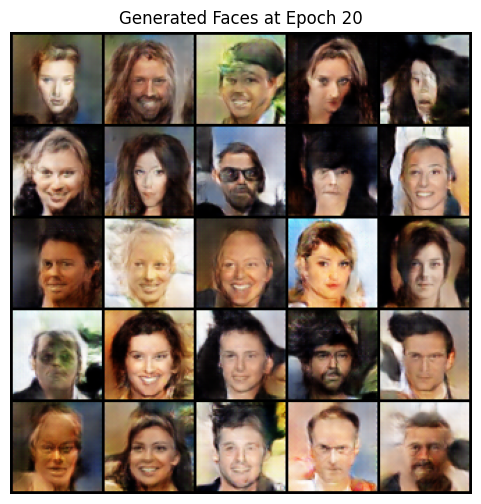

Epoch [21/30] | Loss D: 0.4638, Loss G: 4.6626
Epoch [22/30] | Loss D: 1.6648, Loss G: 1.6197
Epoch [23/30] | Loss D: 0.4465, Loss G: 4.5989
Epoch [24/30] | Loss D: 0.5839, Loss G: 3.9800
Epoch [25/30] | Loss D: 0.9727, Loss G: 2.7267


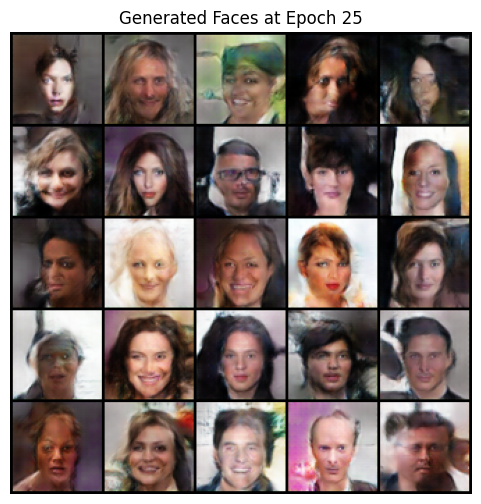

Epoch [26/30] | Loss D: 0.2578, Loss G: 2.4207
Epoch [27/30] | Loss D: 0.3435, Loss G: 5.3947
Epoch [28/30] | Loss D: 0.1180, Loss G: 5.2119
Epoch [29/30] | Loss D: 0.3867, Loss G: 7.6980
Epoch [30/30] | Loss D: 0.1634, Loss G: 5.3908


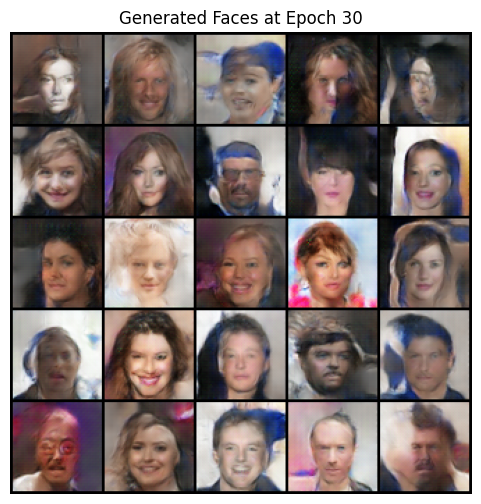

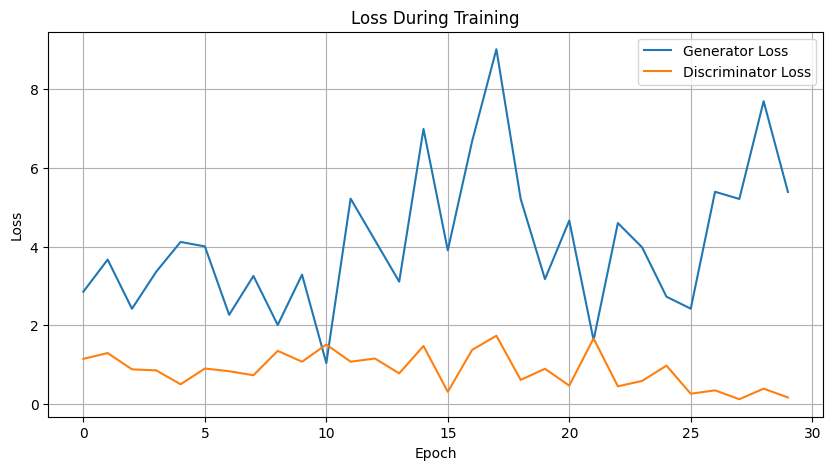

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.datasets.folder import default_loader
import matplotlib.pyplot as plt
import os
import random
import numpy as np

# ----------------------------
# Config
# ----------------------------
image_size = 64
channels_img = 3
noise_dim = 100
batch_size = 16
lr = 0.005
num_epochs = 30
max_files = 22599
subset_size = 11599
face_folder = 'img_align_celeba'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ----------------------------
# Data Preparation
# ----------------------------
class SmallImageFolder(Dataset):
    def __init__(self, root, transform, max_files=2000):
        self.transform = transform
        self.paths = sorted([
            fname for fname in os.listdir(root)
            if fname.lower().endswith(('.jpg', '.png', '.jpeg'))
        ])[:max_files]
        self.root = root

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, self.paths[idx])
        image = default_loader(img_path)
        return self.transform(image), 0

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

full_dataset = SmallImageFolder(face_folder, transform, max_files)
indices = random.sample(range(len(full_dataset)), subset_size)
subset_dataset = Subset(full_dataset, indices)
loader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

# ----------------------------
# Generator
# ----------------------------
class Generator(nn.Module):
    def __init__(self, noise_dim, channels_img):
        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(noise_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512), nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256), nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128), nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64), nn.ReLU(True),
            nn.ConvTranspose2d(64, channels_img, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)

# ----------------------------
# Discriminator
# ----------------------------
class Discriminator(nn.Module):
    def __init__(self, channels_img):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(channels_img, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128), nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256), nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512), nn.LeakyReLU(0.2),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x).view(-1)

# ----------------------------
# Initialize
# ----------------------------
gen = Generator(noise_dim, channels_img).to(device)
disc = Discriminator(channels_img).to(device)

criterion = nn.BCELoss()
opt_gen = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
opt_disc = torch.optim.Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999))

fixed_noise = torch.randn(32, noise_dim, 1, 1).to(device)

# ----------------------------
# Utility: Display Function
# ----------------------------
def show_generated_images(fake, epoch):
    fake = fake[:25].detach().cpu()
    grid = make_grid(fake, nrow=5, normalize=True)
    plt.figure(figsize=(6, 6))
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.title(f"Generated Faces at Epoch {epoch}")
    plt.axis('off')
    plt.show()

# ----------------------------
# Training Loop with Loss Graph
# ----------------------------
gen_losses = []
disc_losses = []

for epoch in range(num_epochs):
    for real, _ in loader:
        real = real.to(device)
        noise = torch.randn(real.size(0), noise_dim, 1, 1).to(device)
        fake = gen(noise)

        # Train Discriminator
        disc_real = disc(real).view(-1)
        disc_fake = disc(fake.detach()).view(-1)
        loss_disc = criterion(disc_real, torch.ones_like(disc_real)) + \
                    criterion(disc_fake, torch.zeros_like(disc_fake))
        opt_disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        # Train Generator
        output = disc(fake).view(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        opt_gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

    gen_losses.append(loss_gen.item())
    disc_losses.append(loss_disc.item())
    print(f"Epoch [{epoch+1}/{num_epochs}] | Loss D: {loss_disc.item():.4f}, Loss G: {loss_gen.item():.4f}")

    if (epoch + 1) % 5 == 0:
        with torch.no_grad():
            fake = gen(fixed_noise)
            show_generated_images(fake, epoch+1)

# ----------------------------
# Plot Generator and Discriminator Losses
# ----------------------------
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label="Generator Loss")
plt.plot(disc_losses, label="Discriminator Loss")
plt.title("Loss During Training")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

Index(['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes',
       'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair',
       'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin',
       'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones',
       'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard',
       'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
       'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair',
       'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick',
       'Wearing_Necklace', 'Wearing_Necktie', 'Young'],
      dtype='object')
Epoch [1/30] Loss D: 0.8821, Loss G: 2.1736
Epoch [2/30] Loss D: 0.7339, Loss G: 3.5882
Epoch [3/30] Loss D: 1.0740, Loss G: 2.3319
Epoch [4/30] Loss D: 0.9842, Loss G: 2.4176
Epoch [5/30] Loss D: 0.6895, Loss G: 4.0192


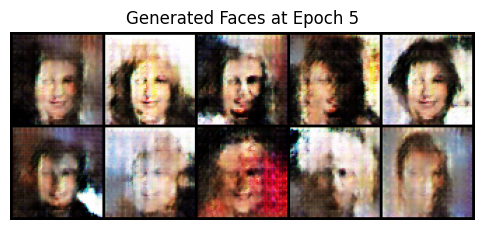

Epoch [6/30] Loss D: 0.7882, Loss G: 4.8677
Epoch [7/30] Loss D: 1.2539, Loss G: 2.4121
Epoch [8/30] Loss D: 0.1988, Loss G: 3.5674
Epoch [9/30] Loss D: 0.5994, Loss G: 4.4764
Epoch [10/30] Loss D: 1.4704, Loss G: 3.4032


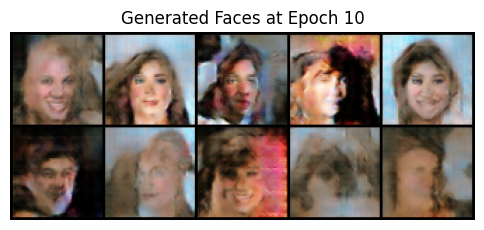

Epoch [11/30] Loss D: 0.6175, Loss G: 5.7390
Epoch [12/30] Loss D: 0.9678, Loss G: 3.3879
Epoch [13/30] Loss D: 1.1276, Loss G: 3.9177
Epoch [14/30] Loss D: 0.0225, Loss G: 5.6875
Epoch [15/30] Loss D: 0.0540, Loss G: 3.9934


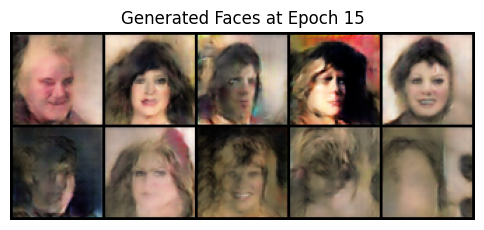

Epoch [16/30] Loss D: 0.0828, Loss G: 3.6304
Epoch [17/30] Loss D: 1.1695, Loss G: 2.2721
Epoch [18/30] Loss D: 0.9805, Loss G: 5.1060
Epoch [19/30] Loss D: 0.4695, Loss G: 3.6005
Epoch [20/30] Loss D: 0.3269, Loss G: 5.4175


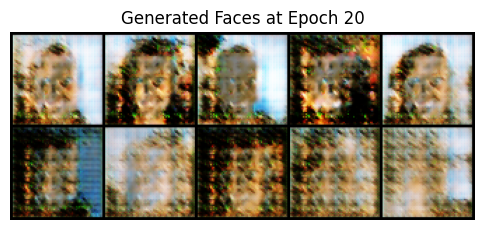

Epoch [21/30] Loss D: 0.8162, Loss G: 6.8974
Epoch [22/30] Loss D: 0.0208, Loss G: 6.7955
Epoch [23/30] Loss D: 0.0580, Loss G: 6.7894
Epoch [24/30] Loss D: 0.5496, Loss G: 4.5468
Epoch [25/30] Loss D: 0.0000, Loss G: 52.4747


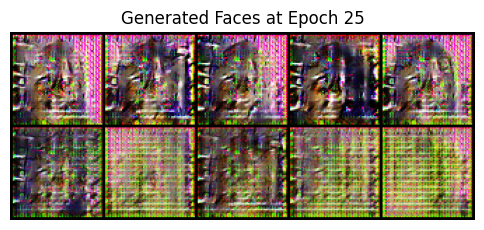

Epoch [26/30] Loss D: 0.0000, Loss G: 51.7986
Epoch [27/30] Loss D: 2.4412, Loss G: 9.3845
Epoch [28/30] Loss D: 0.4905, Loss G: 2.2726
Epoch [29/30] Loss D: 0.4642, Loss G: 5.0947
Epoch [30/30] Loss D: 0.1632, Loss G: 5.5468


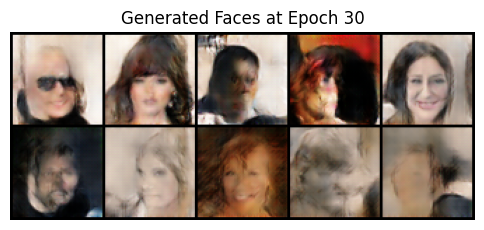

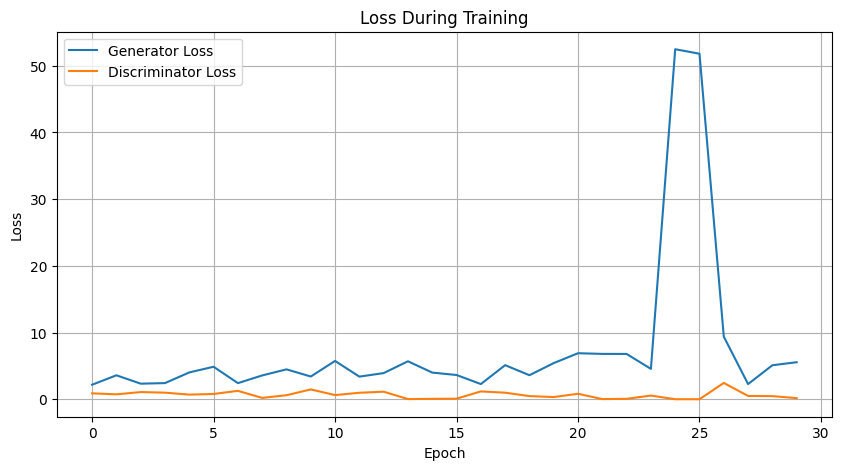

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from PIL import Image
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random

# ----------------------------
# Config
# ----------------------------
image_size = 64
channels_img = 3
noise_dim = 100
num_classes = 2  # Long_Hair: 0 (no), 1 (yes)
batch_size = 16
lr = 0.005
num_epochs = 30
max_files = 22599
subset_size = 11599
device = 'cuda' if torch.cuda.is_available() else 'cpu'
data_root = 'img_align_celeba'
attr_path = '/content/drive/MyDrive/list_attr_celeba.txt'

# ----------------------------
# Data Preparation
# ----------------------------
class CelebALongHairDataset(Dataset):
    def __init__(self, img_dir, attr_file, transform, max_files=2000):
        self.img_dir = img_dir
        df = pd.read_csv(attr_file, sep='\s+', skiprows=1)
        print(df.columns)
        df.index.name = 'image_id'
        df.reset_index(inplace=True)
        df['Long_Hair'] = (df['Bald'] == 0).astype(int)
        self.samples = df[['image_id', 'Long_Hair']].head(max_files)
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        row = self.samples.iloc[idx]
        path = os.path.join(self.img_dir, row['image_id'])
        image = Image.open(path).convert("RGB")
        label = torch.tensor(row['Long_Hair'], dtype=torch.long)
        return self.transform(image), label

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

full_dataset = CelebALongHairDataset(data_root, attr_path, transform, max_files)
indices = random.sample(range(len(full_dataset)), subset_size)
dataset = torch.utils.data.Subset(full_dataset, indices)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# ----------------------------
# Generator
# ----------------------------
class Generator(nn.Module):
    def __init__(self, noise_dim, class_dim, img_channels):
        super().__init__()
        self.label_emb = nn.Embedding(class_dim, class_dim)
        self.model = nn.Sequential(
            nn.ConvTranspose2d(noise_dim + class_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512), nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256), nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128), nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64), nn.ReLU(True),
            nn.ConvTranspose2d(64, img_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        label_embed = self.label_emb(labels).unsqueeze(2).unsqueeze(3)
        x = torch.cat([noise, label_embed], dim=1)
        return self.model(x)

# ----------------------------
# Discriminator
# ----------------------------
class Discriminator(nn.Module):
    def __init__(self, img_channels, class_dim):
        super().__init__()
        self.label_embed = nn.Embedding(class_dim, class_dim)
        self.model = nn.Sequential(
            nn.Conv2d(img_channels + class_dim, 64, 4, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128), nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256), nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, 4, 2, 1),
            nn.BatchNorm2d(512), nn.LeakyReLU(0.2),
            nn.Conv2d(512, 1, 4, 1, 0),
            nn.Sigmoid()
        )

    def forward(self, img, labels):
        label_embed = self.label_embed(labels).unsqueeze(2).unsqueeze(3).expand(-1, -1, img.size(2), img.size(3))
        x = torch.cat([img, label_embed], dim=1)
        return self.model(x).view(-1)

# ----------------------------
# Initialize
# ----------------------------
gen = Generator(noise_dim, num_classes, channels_img).to(device)
disc = Discriminator(channels_img, num_classes).to(device)

criterion = nn.BCELoss()
opt_gen = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
opt_disc = torch.optim.Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999))

fixed_noise = torch.randn(10, noise_dim, 1, 1).to(device)
fixed_labels = torch.tensor([0]*5 + [1]*5).to(device)

# ----------------------------
# Utility: Show Grid
# ----------------------------
def show_images(fake, epoch):
    fake = fake.detach().cpu()
    grid = make_grid(fake, nrow=5, normalize=True)
    plt.figure(figsize=(6, 6))
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.title(f"Generated Faces at Epoch {epoch}")
    plt.axis('off')
    plt.show()

# ----------------------------
# Training Loop
# ----------------------------
gen_losses = []
disc_losses = []

for epoch in range(num_epochs):
    for real, labels in loader:
        real, labels = real.to(device), labels.to(device)
        noise = torch.randn(real.size(0), noise_dim, 1, 1).to(device)
        fake = gen(noise, labels)

        # Discriminator
        disc_real = disc(real, labels)
        disc_fake = disc(fake.detach(), labels)
        loss_disc = criterion(disc_real, torch.ones_like(disc_real)) + \
                    criterion(disc_fake, torch.zeros_like(disc_fake))
        opt_disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        # Generator
        output = disc(fake, labels)
        loss_gen = criterion(output, torch.ones_like(output))
        opt_gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

    gen_losses.append(loss_gen.item())
    disc_losses.append(loss_disc.item())
    print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {loss_disc.item():.4f}, Loss G: {loss_gen.item():.4f}")

    if (epoch+1) % 5 == 0:
        with torch.no_grad():
            gen_images = gen(fixed_noise, fixed_labels)
            show_images(gen_images, epoch+1)

# ----------------------------
# Plot Losses
# ----------------------------
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label="Generator Loss")
plt.plot(disc_losses, label="Discriminator Loss")
plt.title("Loss During Training")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
!unzip /content/drive/MyDrive/vangogh2photo.zip

Archive:  /content/drive/MyDrive/vangogh2photo.zip
   creating: vangogh2photo/
   creating: vangogh2photo/train/
   creating: vangogh2photo/train/trainA/
  inflating: vangogh2photo/train/trainA/1035.jpg  
  inflating: vangogh2photo/train/trainA/1036.jpg  
  inflating: vangogh2photo/train/trainA/1037.jpg  
  inflating: vangogh2photo/train/trainA/1038.jpg  
  inflating: vangogh2photo/train/trainA/1039.jpg  
  inflating: vangogh2photo/train/trainA/1040.jpg  
  inflating: vangogh2photo/train/trainA/1041.jpg  
  inflating: vangogh2photo/train/trainA/1042.jpg  
  inflating: vangogh2photo/train/trainA/1043.jpg  
  inflating: vangogh2photo/train/trainA/1044.jpg  
  inflating: vangogh2photo/train/trainA/1045.jpg  
  inflating: vangogh2photo/train/trainA/1046.jpg  
  inflating: vangogh2photo/train/trainA/1047.jpg  
  inflating: vangogh2photo/train/trainA/1048.jpg  
  inflating: vangogh2photo/train/trainA/1049.jpg  
  inflating: vangogh2photo/train/trainA/1050.jpg  
  inflating: vangogh2photo/tra

Epoch [1/30] Loss G: 5.7050, D_X: 0.7079, D_Y: 0.4314
Epoch [2/30] Loss G: 4.8361, D_X: 0.3258, D_Y: 0.4537
Epoch [3/30] Loss G: 6.1543, D_X: 0.3731, D_Y: 0.4225
Epoch [4/30] Loss G: 4.2790, D_X: 0.3902, D_Y: 0.3136
Epoch [5/30] Loss G: 4.9385, D_X: 0.2884, D_Y: 0.4446


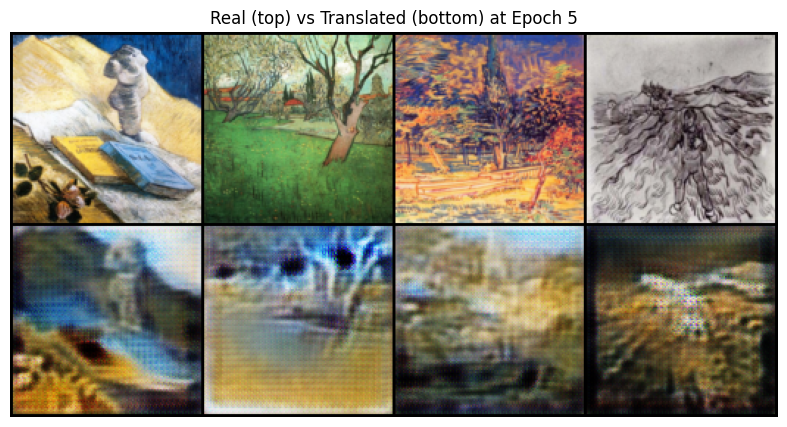

Epoch [6/30] Loss G: 4.8204, D_X: 0.2892, D_Y: 0.3161
Epoch [7/30] Loss G: 4.5359, D_X: 0.3406, D_Y: 0.3997
Epoch [8/30] Loss G: 4.4231, D_X: 0.3680, D_Y: 0.5008
Epoch [9/30] Loss G: 3.8736, D_X: 0.3343, D_Y: 0.3098
Epoch [10/30] Loss G: 4.4621, D_X: 0.3167, D_Y: 0.3714


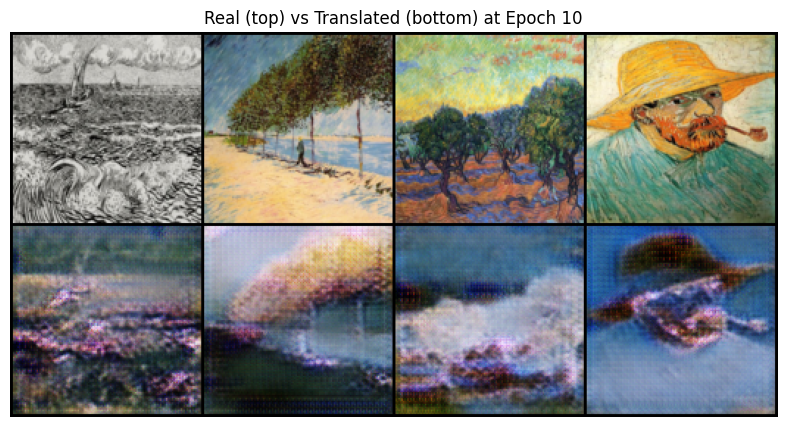

Epoch [11/30] Loss G: 4.7877, D_X: 0.3048, D_Y: 0.4145
Epoch [12/30] Loss G: 3.7981, D_X: 0.2837, D_Y: 0.3668
Epoch [13/30] Loss G: 4.5332, D_X: 0.2911, D_Y: 0.3354
Epoch [14/30] Loss G: 4.3171, D_X: 0.4213, D_Y: 0.3893
Epoch [15/30] Loss G: 4.6139, D_X: 0.3226, D_Y: 0.3179


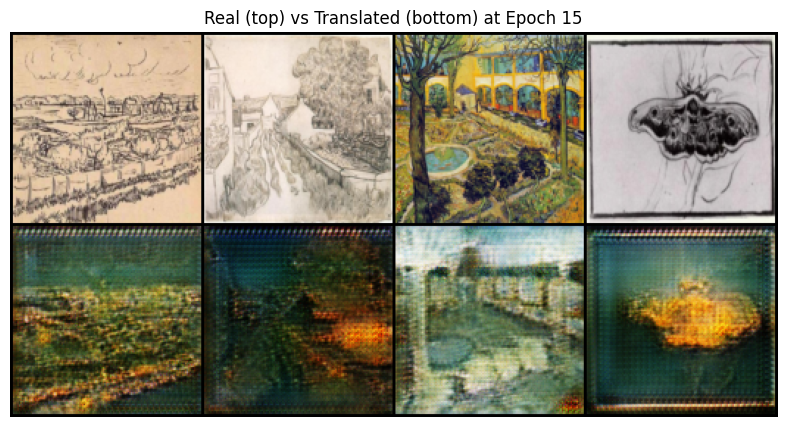

Epoch [16/30] Loss G: 3.8912, D_X: 0.2820, D_Y: 0.4507
Epoch [17/30] Loss G: 4.7507, D_X: 0.2633, D_Y: 0.2979
Epoch [18/30] Loss G: 4.0254, D_X: 0.3642, D_Y: 0.6975
Epoch [19/30] Loss G: 4.8224, D_X: 0.5974, D_Y: 2.3453
Epoch [20/30] Loss G: 3.3225, D_X: 0.2706, D_Y: 0.2547


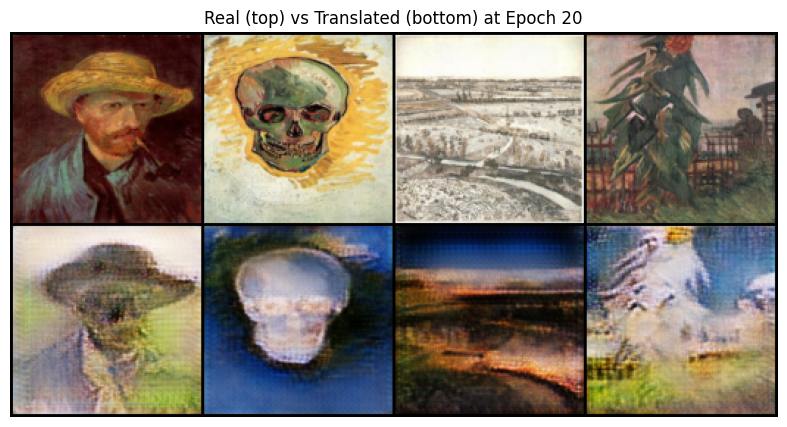

Epoch [21/30] Loss G: 3.6908, D_X: 0.3209, D_Y: 0.3473
Epoch [22/30] Loss G: 4.0511, D_X: 0.3946, D_Y: 0.5289
Epoch [23/30] Loss G: 4.1835, D_X: 0.5219, D_Y: 0.5967
Epoch [24/30] Loss G: 3.7681, D_X: 0.3134, D_Y: 0.2484
Epoch [25/30] Loss G: 4.2613, D_X: 1.2089, D_Y: 0.3240


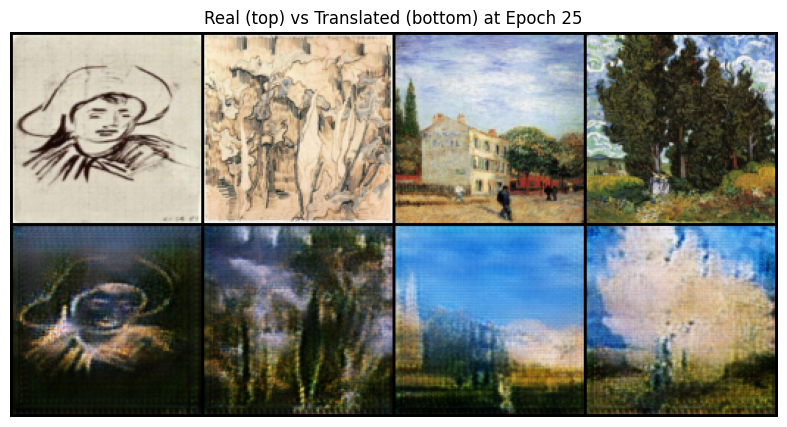

Epoch [26/30] Loss G: 3.5489, D_X: 0.3302, D_Y: 0.2961
Epoch [27/30] Loss G: 3.8035, D_X: 0.3076, D_Y: 0.4194
Epoch [28/30] Loss G: 3.5234, D_X: 0.2478, D_Y: 0.3262
Epoch [29/30] Loss G: 3.4797, D_X: 0.3099, D_Y: 0.5242
Epoch [30/30] Loss G: 3.4270, D_X: 0.2936, D_Y: 0.2639


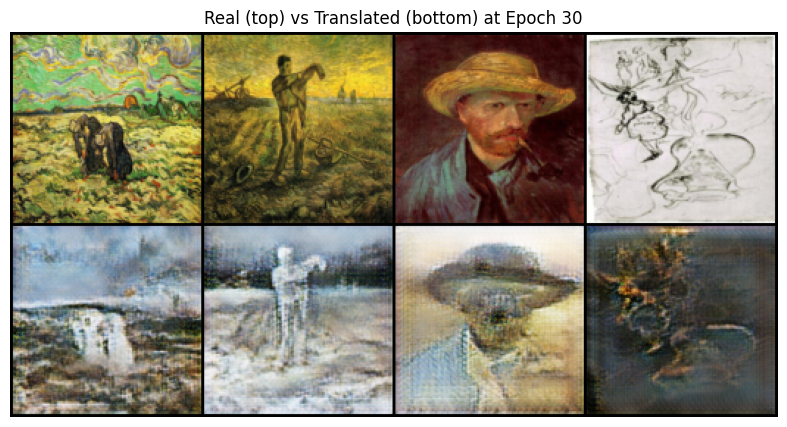

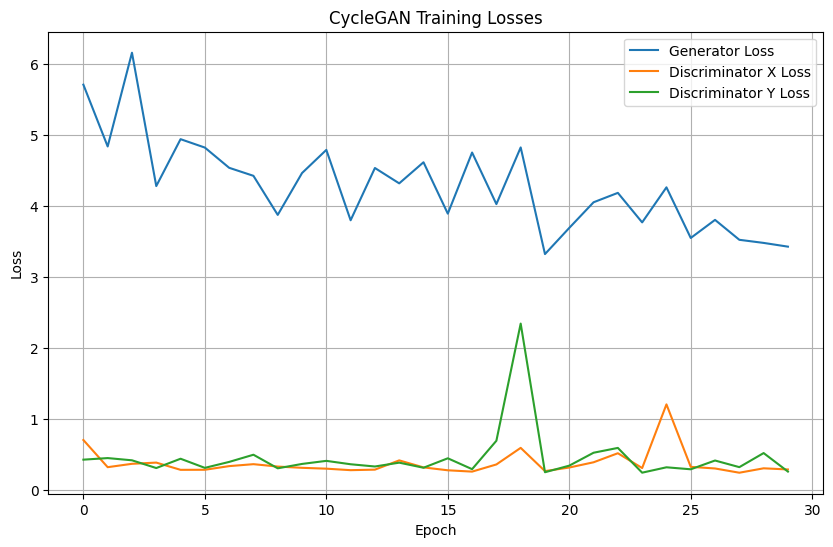

In [ ]:
import torch
import torch.nn as nn
import itertools
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from PIL import Image
import matplotlib.pyplot as plt
import os
import random

# ----------------------------
# Config
# ----------------------------
image_size = 128
batch_size = 16
num_epochs = 30
lr = 0.0002
data_root = '/content/vangogh2photo'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ----------------------------
# Unaligned Custom Dataset
# ----------------------------
class UnalignedDataset(Dataset):
    def __init__(self, dir_A, dir_B, transform=None):
        self.A_paths = sorted([os.path.join(dir_A, f) for f in os.listdir(dir_A) if f.endswith(('jpg', 'png'))])
        self.B_paths = sorted([os.path.join(dir_B, f) for f in os.listdir(dir_B) if f.endswith(('jpg', 'png'))])
        self.transform = transform

    def __len__(self):
        return max(len(self.A_paths), len(self.B_paths))

    def __getitem__(self, index):
        A_path = self.A_paths[index % len(self.A_paths)]
        B_path = random.choice(self.B_paths)
        A_img = Image.open(A_path).convert("RGB")
        B_img = Image.open(B_path).convert("RGB")
        if self.transform:
            A_img = self.transform(A_img)
            B_img = self.transform(B_img)
        return A_img, B_img

# ----------------------------
# Transforms & Datasets
# ----------------------------
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

train_dataset = UnalignedDataset(
    dir_A=os.path.join(data_root, 'train', 'trainA'),
    dir_B=os.path.join(data_root, 'train', 'trainB'),
    transform=transform
)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

valA_paths = sorted([os.path.join(data_root, 'val', 'testA', f) for f in os.listdir(os.path.join(data_root, 'val', 'testA')) if f.endswith(('jpg', 'png'))])
def load_val_images(num_images=4):
    sampled_paths = random.sample(valA_paths, min(num_images, len(valA_paths)))
    images = []
    for path in sampled_paths:
        img = Image.open(path).convert("RGB")
        images.append(transform(img))
    return torch.stack(images)

# ----------------------------
# Generator & Discriminator
# ----------------------------
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.InstanceNorm2d(channels)
        )
    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        model = [
            nn.Conv2d(3, 64, 7, 1, 3),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ]
        in_channels = 64
        out_channels = in_channels * 2
        for _ in range(2):
            model += [
                nn.Conv2d(in_channels, out_channels, 3, 2, 1),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ]
            in_channels = out_channels
            out_channels *= 2
        for _ in range(6):
            model += [ResidualBlock(in_channels)]
        out_channels = in_channels // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_channels, out_channels, 3, 2, 1, output_padding=1),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ]
            in_channels = out_channels
            out_channels //= 2
        model += [nn.Conv2d(64, 3, 7, 1, 3), nn.Tanh()]
        self.model = nn.Sequential(*model)
    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        def conv_block(in_channels, out_channels, stride):
            return [
                nn.Conv2d(in_channels, out_channels, 4, stride, 1),
                nn.InstanceNorm2d(out_channels),
                nn.LeakyReLU(0.2, inplace=True)
            ]
        model = [
            nn.Conv2d(3, 64, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            *conv_block(64, 128, 2),
            *conv_block(128, 256, 2),
            *conv_block(256, 512, 1),
            nn.Conv2d(512, 1, 4, 1, 1)
        ]
        self.model = nn.Sequential(*model)
    def forward(self, x):
        return self.model(x)

# ----------------------------
# Initialize
# ----------------------------
G = Generator().to(device)
F = Generator().to(device)
D_X = Discriminator().to(device)
D_Y = Discriminator().to(device)

opt_G = torch.optim.Adam(itertools.chain(G.parameters(), F.parameters()), lr=lr, betas=(0.5, 0.999))
opt_D_X = torch.optim.Adam(D_X.parameters(), lr=lr, betas=(0.5, 0.999))
opt_D_Y = torch.optim.Adam(D_Y.parameters(), lr=lr, betas=(0.5, 0.999))

criterion_GAN = nn.MSELoss()
criterion_cycle = nn.L1Loss()

# ----------------------------
# Utility: Plot
# ----------------------------
def show_images(real, translated, epoch):
    imgs = torch.cat([real[:4], translated[:4]], dim=0).cpu().detach()
    grid = make_grid(imgs, nrow=4, normalize=True)
    plt.figure(figsize=(10, 5))
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.title(f"Real (top) vs Translated (bottom) at Epoch {epoch}")
    plt.show()

# ----------------------------
# Training Loop
# ----------------------------
G_losses, D_X_losses, D_Y_losses = [], [], []

for epoch in range(num_epochs):
    for real_x, real_y in train_loader:
        real_x = real_x.to(device)
        real_y = real_y.to(device)

        fake_y = G(real_x)
        cycle_x = F(fake_y)
        fake_x = F(real_y)
        cycle_y = G(fake_x)

        D_X_real = D_X(real_x)
        D_X_fake = D_X(fake_x.detach())
        D_Y_real = D_Y(real_y)
        D_Y_fake = D_Y(fake_y.detach())

        loss_G_GAN = criterion_GAN(D_Y(fake_y), torch.ones_like(D_Y_fake))
        loss_F_GAN = criterion_GAN(D_X(fake_x), torch.ones_like(D_X_fake))
        loss_cycle = criterion_cycle(cycle_x, real_x) + criterion_cycle(cycle_y, real_y)
        loss_G = loss_G_GAN + loss_F_GAN + 10 * loss_cycle

        opt_G.zero_grad()
        loss_G.backward()
        opt_G.step()

        loss_D_X = criterion_GAN(D_X_real, torch.ones_like(D_X_real)) + criterion_GAN(D_X_fake, torch.zeros_like(D_X_fake))
        opt_D_X.zero_grad()
        loss_D_X.backward()
        opt_D_X.step()

        loss_D_Y = criterion_GAN(D_Y_real, torch.ones_like(D_Y_real)) + criterion_GAN(D_Y_fake, torch.zeros_like(D_Y_fake))
        opt_D_Y.zero_grad()
        loss_D_Y.backward()
        opt_D_Y.step()

    G_losses.append(loss_G.item())
    D_X_losses.append(loss_D_X.item())
    D_Y_losses.append(loss_D_Y.item())
    print(f"Epoch [{epoch+1}/{num_epochs}] Loss G: {loss_G.item():.4f}, D_X: {loss_D_X.item():.4f}, D_Y: {loss_D_Y.item():.4f}")

    if (epoch+1) % 5 == 0:
        with torch.no_grad():
            val_real = load_val_images().to(device)
            translated = G(val_real)
            show_images(val_real, translated, epoch+1)

plt.figure(figsize=(10, 6))
plt.plot(G_losses, label='Generator Loss')
plt.plot(D_X_losses, label='Discriminator X Loss')
plt.plot(D_Y_losses, label='Discriminator Y Loss')
plt.title('CycleGAN Training Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()
